In [1]:
!pip install pytorch-pfn-extras==0.3.1

     |████████████████████████████████| 85 kB 2.3 MB/s eta 0:00:011
  Created wheel for pytorch-pfn-extras: filename=pytorch_pfn_extras-0.3.1-py3-none-any.whl size=99751 sha256=2bd5b70b9e020ce72748b2b4d80e820d29071f4ea1f17cda6eb385c246184850
  Stored in directory: /root/.cache/pip/wheels/73/b0/72/791433d0455cb8f73d5836d3fd96b7c5582b96ebbe0391efa1
Successfully built pytorch-pfn-extras
You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.


In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
'''for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))'''

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session"

"for dirname, _, filenames in os.walk('/kaggle/input'):\n    for filename in filenames:\n        print(os.path.join(dirname, filename))"

In [3]:
import l5kit

l5kit.__version__

'1.1.0'

In [4]:
import gc
from pathlib import Path
import random
import sys

from tqdm.notebook import tqdm
import scipy as sp


import matplotlib.pyplot as plt
import seaborn as sns

from IPython.core.display import display, HTML


In [5]:
# --- plotly ---
from plotly import tools, subplots
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.express as px
import plotly.figure_factory as ff
import plotly.io as pio
pio.templates.default = "plotly_dark"

# --- models ---
from sklearn import preprocessing
from sklearn.model_selection import KFold
import lightgbm as lgb
import xgboost as xgb
import catboost as cb

# --- setup ---
pd.set_option('max_columns', 50)

In [6]:
from l5kit.data import ChunkedDataset, LocalDataManager
from l5kit.dataset import EgoDataset, AgentDataset

from l5kit.rasterization import build_rasterizer
from l5kit.configs import load_config_data
from l5kit.visualization import draw_trajectory, TARGET_POINTS_COLOR
from l5kit.geometry import transform_points
from tqdm import tqdm
from collections import Counter
from l5kit.data import PERCEPTION_LABELS
from prettytable import PrettyTable

import os

from matplotlib import animation, rc
from IPython.display import HTML

rc('animation', html='jshtml')

In [7]:
import zarr

z = zarr.open("./dataset.zarr", mode="w", shape=(500,), dtype=np.float32, chunks=(100,))

# We can write to it by assigning to it. This gets persisted on disk.
z[0:150] = np.arange(150)

In [8]:
print(z.info)

Type               : zarr.core.Array
Data type          : float32
Shape              : (500,)
Chunk shape        : (100,)
Order              : C
Read-only          : False
Compressor         : Blosc(cname='lz4', clevel=5, shuffle=SHUFFLE, blocksize=0)
Store type         : zarr.storage.DirectoryStore
No. bytes          : 2000 (2.0K)
No. bytes stored   : 577
Storage ratio      : 3.5
Chunks initialized : 2/5



In [9]:
!ls -l ./*

---------- 1 root root  263 Dec 14 06:17 ./__notebook_source__.ipynb

./dataset.zarr:
total 8
-rw-r--r-- 1 root root 157 Dec 14 06:18 0
-rw-r--r-- 1 root root 105 Dec 14 06:18 1


In [10]:
print(z[::20]) # Read every 20th value

[  0.  20.  40.  60.  80. 100. 120. 140.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.]


In [11]:
# set env variable for data
os.environ["L5KIT_DATA_FOLDER"] = "/kaggle/input/lyft-motion-prediction-autonomous-vehicles"
# get config
cfg = load_config_data("/kaggle/input/lyft-config-files/visualisation_config.yaml")
print(cfg)

{'format_version': 4, 'model_params': {'model_architecture': 'resnet50', 'history_num_frames': 0, 'history_step_size': 1, 'history_delta_time': 0.1, 'future_num_frames': 50, 'future_step_size': 1, 'future_delta_time': 0.1}, 'raster_params': {'raster_size': [224, 224], 'pixel_size': [0.5, 0.5], 'ego_center': [0.25, 0.5], 'map_type': 'py_semantic', 'satellite_map_key': 'aerial_map/aerial_map.png', 'semantic_map_key': 'semantic_map/semantic_map.pb', 'dataset_meta_key': 'meta.json', 'filter_agents_threshold': 0.5}, 'val_data_loader': {'key': 'scenes/sample.zarr', 'batch_size': 12, 'shuffle': False, 'num_workers': 16}}


In [82]:
dm = LocalDataManager()
dataset_path = dm.require('scenes/sample.zarr')
zarr_dataset = ChunkedDataset(dataset_path)
zarr_dataset.open()
print(zarr_dataset)

+------------+------------+------------+---------------+-----------------+----------------------+----------------------+----------------------+---------------------+
| Num Scenes | Num Frames | Num Agents | Num TR lights | Total Time (hr) | Avg Frames per Scene | Avg Agents per Frame | Avg Scene Time (sec) | Avg Frame frequency |
+------------+------------+------------+---------------+-----------------+----------------------+----------------------+----------------------+---------------------+
|    100     |   24838    |  1893736   |     316008    |       0.69      |        248.38        |        76.24         |        24.83         |        10.00        |
+------------+------------+------------+---------------+-----------------+----------------------+----------------------+----------------------+---------------------+


In [83]:
dataset_path

'/kaggle/input/lyft-motion-prediction-autonomous-vehicles/scenes/sample.zarr'

In [14]:
frames = zarr_dataset.frames

Text(0.5, 1.0, 'ego_translation of frames')

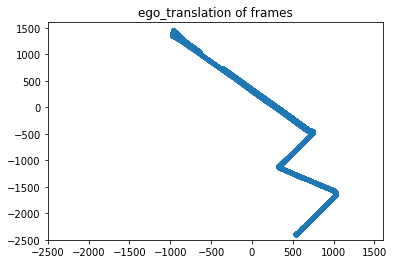

In [15]:
coords = frames["ego_translation"][:, :2]

plt.scatter(coords[:, 0], coords[:, 1], marker='.')
axes = plt.gca()
axes.set_xlim([-2500, 1600])
axes.set_ylim([-2500, 1600])
plt.title("ego_translation of frames")

In [16]:
# 'map_type': 'py_semantic' for cfg.
semantic_rasterizer = build_rasterizer(cfg, dm)
semantic_dataset = EgoDataset(cfg, zarr_dataset, semantic_rasterizer)

/kaggle/usr/lib/kaggle_l5kit/l5kit/dataset/ego.py:152: RuntimeWarning:

disable_traffic_light_faces not found in config, this will raise an error in the future



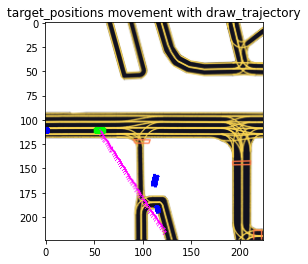

In [17]:
def visualize_trajectory(dataset, index, title="target_positions movement with draw_trajectory"):
    data = dataset[index]
    im = data["image"].transpose(1, 2, 0)
    im = dataset.rasterizer.to_rgb(im)
    target_positions_pixels = transform_points(data["target_positions"] + data["centroid"][:2], data["world_to_image"])
    draw_trajectory(im, target_positions_pixels, TARGET_POINTS_COLOR, 1, data["target_yaws"])

    plt.title(title)
    plt.imshow(im[::-1])
    plt.show()

visualize_trajectory(semantic_dataset, index=0)

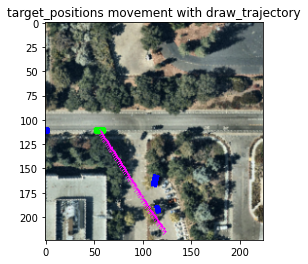

In [18]:
# map_type was changed from 'py_semantic' to 'py_satellite'.
cfg["raster_params"]["map_type"] = "py_satellite"
satellite_rasterizer = build_rasterizer(cfg, dm)
satellite_dataset = EgoDataset(cfg, zarr_dataset, satellite_rasterizer)

visualize_trajectory(satellite_dataset, index=0)

In [19]:
type(satellite_rasterizer), type(semantic_rasterizer)

(l5kit.rasterization.sat_box_rasterizer.SatBoxRasterizer,
 l5kit.rasterization.sem_box_rasterizer.SemBoxRasterizer)

In [20]:
from IPython.display import display, clear_output
import PIL
 
dataset = semantic_dataset
scene_idx = 34
indexes = dataset.get_scene_indices(scene_idx)
images = []

for idx in indexes:
    data = dataset[idx]
    im = data["image"].transpose(1, 2, 0)
    im = dataset.rasterizer.to_rgb(im)
    target_positions_pixels = transform_points(data["target_positions"] + data["centroid"][:2], data["world_to_image"])
    center_in_pixels = np.asarray(cfg["raster_params"]["ego_center"]) * cfg["raster_params"]["raster_size"]
    draw_trajectory(im, target_positions_pixels, TARGET_POINTS_COLOR, 1, data["target_yaws"])
    clear_output(wait=True)
    images.append(PIL.Image.fromarray(im[::-1]))

In [21]:
%%capture
# From https://www.kaggle.com/jpbremer/lyft-scene-visualisations by @jpbremer
def animate_solution(images):

    def animate(i):
        im.set_data(images[i])
        return (im,)
 
    fig, ax = plt.subplots()
    im = ax.imshow(images[0])
    def init():
        im.set_data(images[0])
        return (im,)
    
    return animation.FuncAnimation(fig, animate, init_func=init, frames=len(images), interval=60, blit=True)

anim = animate_solution(images)

In [22]:
HTML(anim.to_jshtml())

In [23]:
import torch
from pathlib import Path

import pytorch_pfn_extras as ppe
from math import ceil
from pytorch_pfn_extras.training import IgniteExtensionsManager
from pytorch_pfn_extras.training.triggers import MinValueTrigger

from torch import nn, optim
from torch.utils.data import DataLoader
from torch.utils.data.dataset import Subset
import pytorch_pfn_extras.training.extensions as E

In [24]:
from typing import Callable

from torch.utils.data.dataset import Dataset


class TransformDataset(Dataset):
    def __init__(self, dataset: Dataset, transform: Callable):
        self.dataset = dataset
        self.transform = transform

    def __getitem__(self, index):
        batch = self.dataset[index]
        return self.transform(batch)

    def __len__(self):
        return len(self.dataset)

## * Implement Loss Function

In [25]:
import numpy as np

import torch
from torch import Tensor


def pytorch_neg_multi_log_likelihood_batch(
    gt: Tensor, pred: Tensor, confidences: Tensor, avails: Tensor
) -> Tensor:
    # convert to (batch_size, num_modes, future_len, num_coords)
    gt = torch.unsqueeze(gt, 1)  # add modes
    avails = avails[:, None, :, None]  # add modes and cords

    # error (batch_size, num_modes, future_len)
    error = torch.sum(((gt - pred) * avails) ** 2, dim=-1)  # reduce coords and use availability

    with np.errstate(divide="ignore"):  # when confidence is 0 log goes to -inf, but we're fine with it
        # error (batch_size, num_modes)
        error = torch.log(confidences) - 0.5 * torch.sum(error, dim=-1)  # reduce time

    # use max aggregator on modes for numerical stability
    # error (batch_size, num_modes)
    max_value, _ = error.max(dim=1, keepdim=True)  # error are negative at this point, so max() gives the minimum one
    error = -torch.log(torch.sum(torch.exp(error - max_value), dim=-1, keepdim=True)) - max_value  # reduce modes
    # print("error", error)
    return torch.mean(error)

In [26]:
def pytorch_neg_multi_log_likelihood_single(
    gt: Tensor, pred: Tensor, avails: Tensor
) -> Tensor:
    # pred (bs)x(time)x(2D coords) --> (bs)x(mode=1)x(time)x(2D coords)
    # create confidence (bs)x(mode=1)
    batch_size, future_len, num_coords = pred.shape
    confidences = pred.new_ones((batch_size, 1))
    return pytorch_neg_multi_log_likelihood_batch(gt, pred.unsqueeze(1), confidences, avails)

## Define model 

In [27]:
# --- Model utils ---
import torch
from torchvision.models import resnet18
from torch import nn
from typing import Dict

class LyftMultiModel(nn.Module):
    def __init__(self, cfg: Dict, num_modes=3):
        super().__init__()

        backbone = resnet18(pretrained=True, progress=True)
        self.backbone = backbone

        num_history_channels = (cfg["model_params"]["history_num_frames"] + 1) * 2
        num_in_channels = 3 + num_history_channels

        self.backbone.conv1 = nn.Conv2d(
            num_in_channels,
            self.backbone.conv1.out_channels,
            kernel_size=self.backbone.conv1.kernel_size,
            stride=self.backbone.conv1.stride,
            padding=self.backbone.conv1.padding,
            bias=False,
        )
        # This is 512 for resnet18 and resnet34;
        # And it is 2048 for the other resnets
        backbone_out_features = 512

        # X, Y coords for the future positions (output shape: Bx50x2)
        self.future_len = cfg["model_params"]["future_num_frames"]
        num_targets = 2 * self.future_len

        # You can add more layers here.
        self.head = nn.Sequential(
            nn.Dropout(0.2),
            nn.Linear(in_features=backbone_out_features, out_features=4096),
        )

        self.num_preds = num_targets * num_modes
        self.num_modes = num_modes

        self.logit = nn.Linear(4096, out_features=self.num_preds + num_modes)
    
    def forward(self, x):
        x = self.backbone.conv1(x)
        x = self.backbone.bn1(x)
        x = self.backbone.relu(x)
        x = self.backbone.maxpool(x)

        x = self.backbone.layer1(x)
        x = self.backbone.layer2(x)
        x = self.backbone.layer3(x)
        x = self.backbone.layer4(x)

        x = self.backbone.avgpool(x)
        x = torch.flatten(x, 1)
        x = self.head(x)
        x = self.logit(x)

        # pred (bs)x(modes)x(time)x(2D coords)
        # confidences (bs)x(modes)
        bs, _ = x.shape
        pred, confidences = torch.split(x, self.num_preds, dim=1)
        pred = pred.view(bs, self.num_modes, self.future_len, 2)
        assert confidences.shape == (bs, self.num_modes)
        confidences = torch.softmax(confidences, dim=1)
        return pred, confidences


In [28]:
# --- Model utils ---
import torch
from torchvision.models import resnet50
from torch import nn
from typing import Dict

class LyftMultiModel50(nn.Module):
    def __init__(self, cfg: Dict, num_modes=3):
        super().__init__()

        backbone = resnet50(pretrained=True, progress=True)
        self.backbone = backbone

        num_history_channels = (cfg["model_params"]["history_num_frames"] + 1) * 2
        num_in_channels = 3 + num_history_channels

        self.backbone.conv1 = nn.Conv2d(
            num_in_channels,
            self.backbone.conv1.out_channels,
            kernel_size=self.backbone.conv1.kernel_size,
            stride=self.backbone.conv1.stride,
            padding=self.backbone.conv1.padding,
            bias=False,
        )
        # This is 512 for resnet18 and resnet34;
        # And it is 2048 for the other resnets
        backbone_out_features = 2048

        # X, Y coords for the future positions (output shape: Bx50x2)
        self.future_len = cfg["model_params"]["future_num_frames"]
        num_targets = 2 * self.future_len

        # You can add more layers here.
        self.head = nn.Sequential(
            nn.Dropout(0.2),
            nn.Linear(in_features=backbone_out_features, out_features=4096),
        )

        self.num_preds = num_targets * num_modes
        self.num_modes = num_modes

        self.logit = nn.Linear(4096, out_features=self.num_preds + num_modes)
    
    def forward(self, x):
        x = self.backbone.conv1(x)
        x = self.backbone.bn1(x)
        x = self.backbone.relu(x)
        x = self.backbone.maxpool(x)

        x = self.backbone.layer1(x)
        x = self.backbone.layer2(x)
        x = self.backbone.layer3(x)
        x = self.backbone.layer4(x)

        x = self.backbone.avgpool(x)
        x = torch.flatten(x, 1)
        x = self.head(x)
        x = self.logit(x)

        # pred (bs)x(modes)x(time)x(2D coords)
        # confidences (bs)x(modes)
        bs, _ = x.shape
        pred, confidences = torch.split(x, self.num_preds, dim=1)
        pred = pred.view(bs, self.num_modes, self.future_len, 2)
        assert confidences.shape == (bs, self.num_modes)
        confidences = torch.softmax(confidences, dim=1)
        return pred, confidences


In [29]:
class LyftMultiRegressor(nn.Module):
    """Single mode prediction"""
    def __init__(self, predictor, lossfun=pytorch_neg_multi_log_likelihood_batch):
        super().__init__()
        self.predictor = predictor
        self.lossfun = lossfun

    def forward(self, image, targets, target_availabilities):
        pred, confidences = self.predictor(image)
        loss = self.lossfun(targets, pred, confidences, target_availabilities)
        metrics = {
            "loss": loss.item(),
            "nll": pytorch_neg_multi_log_likelihood_batch(targets, pred, confidences, target_availabilities).item()
        }
        ppe.reporting.report(metrics, self)
        return loss, metrics

## Training with Ignite 

In [30]:
# --- Training utils ---
from ignite.engine import Engine


def create_trainer(model, optimizer, device) -> Engine:
    model.to(device)

    def update_fn(engine, batch):
        model.train()
        optimizer.zero_grad()
        loss, metrics = model(*[elem.to(device) for elem in batch])
        loss.backward()
        optimizer.step()
        return metrics
    trainer = Engine(update_fn)
    return trainer

In [31]:
import yaml


def save_yaml(filepath, content, width=120):
    with open(filepath, 'w') as f:
        yaml.dump(content, f, width=width)


def load_yaml(filepath):
    with open(filepath, 'r') as f:
        content = yaml.safe_load(f)
    return content

class DotDict(dict):
    """dot.notation access to dictionary attributes

    Refer: https://stackoverflow.com/questions/2352181/how-to-use-a-dot-to-access-members-of-dictionary/23689767#23689767
    """  # NOQA

    __getattr__ = dict.get
    __setattr__ = dict.__setitem__
    __delattr__ = dict.__delitem__


In [32]:
# --- Lyft configs ---
cfg = {
    'format_version': 4,
    'model_params': {
        'model_architecture': 'resnet50',
        'history_num_frames': 5, # fading 
        'history_step_size': 1,
        'history_delta_time': 0.1,
        'future_num_frames': 50,
        'future_step_size': 1,
        'future_delta_time': 0.1
    },

    'raster_params': {
        'raster_size': [300, 300],
        'pixel_size': [0.1, 0.1],
        'ego_center': [0.5, 0.25], #actor is positioned at pixel 150,75 in 300x300 raster
        'map_type': 'py_semantic',
        'satellite_map_key': 'aerial_map/aerial_map.png',
        'semantic_map_key': 'semantic_map/semantic_map.pb',
        'dataset_meta_key': 'meta.json',
        'filter_agents_threshold': 0.5
    },

    'train_data_loader': {
        'key': 'scenes/train.zarr',
        'batch_size': 12,
        'shuffle': True,
        'num_workers': 4
    },
    'valid_data_loader': {
        'key': 'scenes/validate.zarr',
        'batch_size': 32,
        'shuffle': False,
        'num_workers': 4
    },
    'test_data_loader': {
        'key': 'scenes/test.zarr',
        'batch_size': 8,
        'shuffle': False,
        'num_workers': 4
    },

    'train_params': {
        'max_num_steps': 10000,
        'checkpoint_every_n_steps': 5000,

        # 'eval_every_n_steps': -1
    }
}

In [33]:
flags_dict = {
    "debug": True,
    # --- Data configs ---
    "l5kit_data_folder": "/kaggle/input/lyft-motion-prediction-autonomous-vehicles",
    # --- Model configs ---
    "pred_mode": "multi",
    # --- Training configs ---
    "device": "cuda:0",
    "out_dir": "results/multi_train/resnet18",
    "epoch": 10,
    "snapshot_freq": 50,
}

In [34]:
flags_dict_resnet50 = {
    "debug": True,
    # --- Data configs ---
    "l5kit_data_folder": "/kaggle/input/lyft-motion-prediction-autonomous-vehicles",
    # --- Model configs ---
    "pred_mode": "multi",
    # --- Training configs ---
    "device": "cuda:0",
    "out_dir": "results/multi_train/resnet50",
    "epoch": 10,
    "snapshot_freq": 50,
}

## Loading data

In [35]:
flags = DotDict(flags_dict)
out_dir = Path(flags.out_dir)
os.makedirs(str(out_dir), exist_ok=True)
print(f"flags: {flags_dict}")
save_yaml(out_dir / 'flags.yaml', flags_dict)
save_yaml(out_dir / 'cfg.yaml', cfg)
debug = flags.debug

flags: {'debug': True, 'l5kit_data_folder': '/kaggle/input/lyft-motion-prediction-autonomous-vehicles', 'pred_mode': 'multi', 'device': 'cuda:0', 'out_dir': 'results/multi_train/resnet18', 'epoch': 10, 'snapshot_freq': 50}


In [36]:
# set env variable for data
os.environ["L5KIT_DATA_FOLDER"] = flags.l5kit_data_folder
dm = LocalDataManager(None)

print("Load dataset...")
train_cfg = cfg["train_data_loader"]
valid_cfg = cfg["valid_data_loader"]

# Rasterizer
rasterizer = build_rasterizer(cfg, dm)

# Train dataset/dataloader
def transform(batch):
    return batch["image"], batch["target_positions"], batch["target_availabilities"]

train_path = "scenes/sample.zarr" if debug else train_cfg["key"]
train_zarr = ChunkedDataset(dm.require(train_path)).open()
print("train_zarr", type(train_zarr))
train_agent_dataset = AgentDataset(cfg, train_zarr, rasterizer)
train_dataset = TransformDataset(train_agent_dataset, transform)
if debug:
    # Only use 1000 dataset for fast check...
    train_dataset = Subset(train_dataset, np.arange(1000))
train_loader = DataLoader(train_dataset,
                          shuffle=train_cfg["shuffle"],
                          batch_size=train_cfg["batch_size"],
                          num_workers=train_cfg["num_workers"])
print(train_agent_dataset)

valid_path = "scenes/sample.zarr" if debug else valid_cfg["key"]
valid_zarr = ChunkedDataset(dm.require(valid_path)).open()
print("valid_zarr", type(train_zarr))
valid_agent_dataset = AgentDataset(cfg, valid_zarr, rasterizer)
valid_dataset = TransformDataset(valid_agent_dataset, transform)
if debug:
    # Only use 100 dataset for fast check...
    valid_dataset = Subset(valid_dataset, np.arange(100))
else:
    # Only use 1000 dataset for fast check...
    valid_dataset = Subset(valid_dataset, np.arange(1000))
valid_loader = DataLoader(
    valid_dataset,
    shuffle=valid_cfg["shuffle"],
    batch_size=valid_cfg["batch_size"],
    num_workers=valid_cfg["num_workers"]
)

print(valid_agent_dataset)
print("# AgentDataset train:", len(train_agent_dataset), "#valid", len(valid_agent_dataset))
print("# ActualDataset train:", len(train_dataset), "#valid", len(valid_dataset))
# AgentDataset train: 22496709 #valid 21624612
# ActualDataset train: 100 #valid 100

Load dataset...
train_zarr <class 'l5kit.data.zarr_dataset.ChunkedDataset'>
+------------+------------+------------+---------------+-----------------+----------------------+----------------------+----------------------+---------------------+
| Num Scenes | Num Frames | Num Agents | Num TR lights | Total Time (hr) | Avg Frames per Scene | Avg Agents per Frame | Avg Scene Time (sec) | Avg Frame frequency |
+------------+------------+------------+---------------+-----------------+----------------------+----------------------+----------------------+---------------------+
|    100     |   24838    |  1893736   |     316008    |       0.69      |        248.38        |        76.24         |        24.83         |        10.00        |
+------------+------------+------------+---------------+-----------------+----------------------+----------------------+----------------------+---------------------+
valid_zarr <class 'l5kit.data.zarr_dataset.ChunkedDataset'>
+------------+------------+-------

## Prepare model & optimizer

In [37]:
device = torch.device(flags.device)

if flags.pred_mode == "multi":
    predictor = LyftMultiModel(cfg)
    model = LyftMultiRegressor(predictor)
else:
    raise ValueError(f"[ERROR] Unexpected value flags.pred_mode={flags.pred_mode}")

model.to(device)
optimizer = optim.Adam(model.parameters(), lr=1e-3)

Downloading: "https://download.pytorch.org/models/resnet18-5c106cde.pth" to /root/.cache/torch/hub/checkpoints/resnet18-5c106cde.pth


## Training code - Resnet18

In [38]:
trainer = create_trainer(model, optimizer, device)

def eval_func(*batch):
    loss, metrics = model(*[elem.to(device) for elem in batch])


valid_evaluator = E.Evaluator(
    valid_loader,
    model,
    progress_bar=False,
    eval_func=eval_func,
)

log_trigger = (10 if debug else 1000, "iteration")
log_report = E.LogReport(trigger=log_trigger)

extensions = [
    log_report,  # Save `log` to file
    valid_evaluator,  # Run evaluation for valid dataset in each epoch.
    # E.FailOnNonNumber()  # Stop training when nan is detected.
    E.ProgressBarNotebook(update_interval=10 if debug else 100),  # Show progress bar during training
    E.PrintReportNotebook(),  # Show "log" on jupyter notebook  
]

epoch = flags.epoch

models = {"main": model}
optimizers = {"main": optimizer}
manager = IgniteExtensionsManager(
    trainer,
    models,
    optimizers,
    epoch,
    extensions=extensions,
    out_dir=str(out_dir),
)

manager.extend(E.snapshot_object(predictor, "predictor.pt"),
               trigger=(flags.snapshot_freq, "iteration"))
scheduler = torch.optim.lr_scheduler.ExponentialLR(
    optimizer, gamma=0.99999)
manager.extend(lambda manager: scheduler.step(), trigger=(1, "iteration"))
manager.extend(E.observe_lr(optimizer=optimizer), trigger=log_trigger)
manager.iteration = 0
manager._iters_per_epoch = len(train_loader)

trainer.run(train_loader, max_epochs=epoch)

HTML(value='')

/kaggle/usr/lib/kaggle_l5kit/l5kit/dataset/agent.py:115: RuntimeWarning:

disable_traffic_light_faces not found in config, this will raise an error in the future

/kaggle/usr/lib/kaggle_l5kit/l5kit/dataset/agent.py:115: RuntimeWarning:

disable_traffic_light_faces not found in config, this will raise an error in the future

/kaggle/usr/lib/kaggle_l5kit/l5kit/dataset/agent.py:115: RuntimeWarning:

disable_traffic_light_faces not found in config, this will raise an error in the future

/kaggle/usr/lib/kaggle_l5kit/l5kit/dataset/agent.py:115: RuntimeWarning:

disable_traffic_light_faces not found in config, this will raise an error in the future

/kaggle/usr/lib/kaggle_l5kit/l5kit/dataset/agent.py:115: RuntimeWarning:

disable_traffic_light_faces not found in config, this will raise an error in the future

/kaggle/usr/lib/kaggle_l5kit/l5kit/dataset/agent.py:115: RuntimeWarning:

disable_traffic_light_faces not found in config, this will raise an error in the future

/kaggle/usr/lib/kaggle

/kaggle/usr/lib/kaggle_l5kit/l5kit/dataset/agent.py:115: RuntimeWarning:

disable_traffic_light_faces not found in config, this will raise an error in the future

/kaggle/usr/lib/kaggle_l5kit/l5kit/dataset/agent.py:115: RuntimeWarning:

disable_traffic_light_faces not found in config, this will raise an error in the future

/kaggle/usr/lib/kaggle_l5kit/l5kit/dataset/agent.py:115: RuntimeWarning:

disable_traffic_light_faces not found in config, this will raise an error in the future

/kaggle/usr/lib/kaggle_l5kit/l5kit/dataset/agent.py:115: RuntimeWarning:

disable_traffic_light_faces not found in config, this will raise an error in the future

/kaggle/usr/lib/kaggle_l5kit/l5kit/dataset/agent.py:115: RuntimeWarning:

disable_traffic_light_faces not found in config, this will raise an error in the future

/kaggle/usr/lib/kaggle_l5kit/l5kit/dataset/agent.py:115: RuntimeWarning:

disable_traffic_light_faces not found in config, this will raise an error in the future

/kaggle/usr/lib/kaggle

State:
	iteration: 840
	epoch: 10
	epoch_length: 84
	max_epochs: 10
	output: <class 'dict'>
	batch: <class 'list'>
	metrics: <class 'dict'>
	dataloader: <class 'torch.utils.data.dataloader.DataLoader'>
	seed: <class 'NoneType'>
	times: <class 'dict'>

In [39]:
df = log_report.to_dataframe()
df.to_csv(out_dir/"log.csv", index=False)
df

,main/loss,main/nll,lr,epoch,iteration,elapsed_time,validation/main/loss,validation/main/nll
0,1345.944391,1345.944391,0.001000,0,10,10.638411,NaN,NaN
1,717.498917,717.498917,0.001000,0,20,17.585875,NaN,NaN
2,677.285931,677.285931,0.001000,0,30,25.347235,NaN,NaN
3,713.424263,713.424263,0.001000,0,40,31.573116,NaN,NaN
4,634.423721,634.423721,0.001000,0,50,39.193353,NaN,NaN
...,...,...,...,...,...,...,...,...
79,59.984361,59.984361,0.000992,9,800,637.785325,NaN,NaN
80,64.282277,64.282277,0.000992,9,810,645.253837,NaN,NaN
81,56.194121,56.194121,0.000992,9,820,651.910003,NaN,NaN
82,55.136168,55.136168,0.000992,9,830,658.540141,NaN,NaN


In [40]:
# Let's see training results directory

!ls results/multi_train/resnet18

cfg.yaml  flags.yaml  log  log.csv  predictor.pt


## Training code - Resnet50

In [41]:
device = torch.device(flags.device)

if flags.pred_mode == "multi":
    predictor50 = LyftMultiModel50(cfg)
    model50 = LyftMultiRegressor(predictor50)
else:
    raise ValueError(f"[ERROR] Unexpected value flags.pred_mode={flags.pred_mode}")

model.to(device)
optimizer = optim.Adam(model50.parameters(), lr=1e-3)

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth


In [42]:
flags = DotDict(flags_dict_resnet50)
out_dir = Path(flags.out_dir)
os.makedirs(str(out_dir), exist_ok=True)
print(f"flags: {flags_dict}")
save_yaml(out_dir / 'flags.yaml', flags_dict)
save_yaml(out_dir / 'cfg.yaml', cfg)
debug = flags.debug

flags: {'debug': True, 'l5kit_data_folder': '/kaggle/input/lyft-motion-prediction-autonomous-vehicles', 'pred_mode': 'multi', 'device': 'cuda:0', 'out_dir': 'results/multi_train/resnet18', 'epoch': 10, 'snapshot_freq': 50}


In [43]:
trainer = create_trainer(model50, optimizer, device)

def eval_func(*batch):
    loss, metrics = model50(*[elem.to(device) for elem in batch])


valid_evaluator = E.Evaluator(
    valid_loader,
    model50,
    progress_bar=False,
    eval_func=eval_func,
)

log_trigger = (10 if debug else 1000, "iteration")
log_report = E.LogReport(trigger=log_trigger)

extensions = [
    log_report,  # Save `log` to file
    valid_evaluator,  # Run evaluation for valid dataset in each epoch.
    # E.FailOnNonNumber()  # Stop training when nan is detected.
    E.ProgressBarNotebook(update_interval=10 if debug else 100),  # Show progress bar during training
    E.PrintReportNotebook(),  # Show "log" on jupyter notebook  
]

epoch = flags.epoch

models = {"main": model50}
optimizers = {"main": optimizer}
manager = IgniteExtensionsManager(
    trainer,
    models,
    optimizers,
    epoch,
    extensions=extensions,
    out_dir=str(out_dir),
)

manager.extend(E.snapshot_object(predictor50, "predictor.pt"),
               trigger=(flags.snapshot_freq, "iteration"))
scheduler = torch.optim.lr_scheduler.ExponentialLR(
    optimizer, gamma=0.99999)
manager.extend(lambda manager: scheduler.step(), trigger=(1, "iteration"))
manager.extend(E.observe_lr(optimizer=optimizer), trigger=log_trigger)
manager.iteration = 0
manager._iters_per_epoch = len(train_loader)

trainer.run(train_loader, max_epochs=epoch)

HTML(value='')

/kaggle/usr/lib/kaggle_l5kit/l5kit/dataset/agent.py:115: RuntimeWarning:

disable_traffic_light_faces not found in config, this will raise an error in the future

/kaggle/usr/lib/kaggle_l5kit/l5kit/dataset/agent.py:115: RuntimeWarning:

disable_traffic_light_faces not found in config, this will raise an error in the future

/kaggle/usr/lib/kaggle_l5kit/l5kit/dataset/agent.py:115: RuntimeWarning:

disable_traffic_light_faces not found in config, this will raise an error in the future

/kaggle/usr/lib/kaggle_l5kit/l5kit/dataset/agent.py:115: RuntimeWarning:

disable_traffic_light_faces not found in config, this will raise an error in the future

/kaggle/usr/lib/kaggle_l5kit/l5kit/dataset/agent.py:115: RuntimeWarning:

disable_traffic_light_faces not found in config, this will raise an error in the future

/kaggle/usr/lib/kaggle_l5kit/l5kit/dataset/agent.py:115: RuntimeWarning:

disable_traffic_light_faces not found in config, this will raise an error in the future

/kaggle/usr/lib/kaggle

/kaggle/usr/lib/kaggle_l5kit/l5kit/dataset/agent.py:115: RuntimeWarning:

disable_traffic_light_faces not found in config, this will raise an error in the future

/kaggle/usr/lib/kaggle_l5kit/l5kit/dataset/agent.py:115: RuntimeWarning:

disable_traffic_light_faces not found in config, this will raise an error in the future

/kaggle/usr/lib/kaggle_l5kit/l5kit/dataset/agent.py:115: RuntimeWarning:

disable_traffic_light_faces not found in config, this will raise an error in the future

/kaggle/usr/lib/kaggle_l5kit/l5kit/dataset/agent.py:115: RuntimeWarning:

disable_traffic_light_faces not found in config, this will raise an error in the future

/kaggle/usr/lib/kaggle_l5kit/l5kit/dataset/agent.py:115: RuntimeWarning:

disable_traffic_light_faces not found in config, this will raise an error in the future

/kaggle/usr/lib/kaggle_l5kit/l5kit/dataset/agent.py:115: RuntimeWarning:

disable_traffic_light_faces not found in config, this will raise an error in the future

/kaggle/usr/lib/kaggle

State:
	iteration: 840
	epoch: 10
	epoch_length: 84
	max_epochs: 10
	output: <class 'dict'>
	batch: <class 'list'>
	metrics: <class 'dict'>
	dataloader: <class 'torch.utils.data.dataloader.DataLoader'>
	seed: <class 'NoneType'>
	times: <class 'dict'>

In [44]:
df = log_report.to_dataframe()
df.to_csv(out_dir/"log.csv", index=False)
df

,main/loss,main/nll,lr,epoch,iteration,elapsed_time,validation/main/loss,validation/main/nll
0,1025.568558,1025.568558,0.001000,0,10,10.823782,NaN,NaN
1,527.254858,527.254858,0.001000,0,20,18.739170,NaN,NaN
2,1257.594858,1257.594858,0.001000,0,30,26.496470,NaN,NaN
3,1611.243054,1611.243054,0.001000,0,40,33.298293,NaN,NaN
4,672.799062,672.799062,0.001000,0,50,40.914415,NaN,NaN
...,...,...,...,...,...,...,...,...
79,190.533666,190.533666,0.000992,9,800,673.390854,NaN,NaN
80,447.848038,447.848038,0.000992,9,810,680.707138,NaN,NaN
81,237.888866,237.888866,0.000992,9,820,687.968300,NaN,NaN
82,180.739744,180.739744,0.000992,9,830,694.758028,NaN,NaN


In [45]:
!ls results/multi_train/resnet50

cfg.yaml  flags.yaml  log  log.csv  predictor.pt


# Prediction with the trained model

In [46]:
def run_prediction(predictor, data_loader):
    predictor.eval()

    pred_coords_list = []
    confidences_list = []
    timestamps_list = []
    track_id_list = []

    with torch.no_grad():
        dataiter = tqdm(data_loader)
        for data in dataiter:
            image = data["image"].to(device)
            # target_availabilities = data["target_availabilities"].to(device)
            # targets = data["target_positions"].to(device)
            pred, confidences = predictor(image)

            pred_coords_list.append(pred.cpu().numpy().copy())
            confidences_list.append(confidences.cpu().numpy().copy())
            timestamps_list.append(data["timestamp"].numpy().copy())
            track_id_list.append(data["track_id"].numpy().copy())
    timestamps = np.concatenate(timestamps_list)
    track_ids = np.concatenate(track_id_list)
    coords = np.concatenate(pred_coords_list)
    confs = np.concatenate(confidences_list)
    return timestamps, track_ids, coords, confs

In [47]:
l5kit_data_folder = "/kaggle/input/lyft-motion-prediction-autonomous-vehicles"
os.environ["L5KIT_DATA_FOLDER"] = l5kit_data_folder
dm = LocalDataManager(None)

print("Load dataset...")
default_test_cfg = {
    'key': 'scenes/test.zarr',
    'batch_size': 32,
    'shuffle': False,
    'num_workers': 4
}
test_cfg = cfg.get("test_data_loader", default_test_cfg)

# Rasterizer
rasterizer = build_rasterizer(cfg, dm)

test_path = test_cfg["key"]
print(f"Loading from {test_path}")
test_zarr = ChunkedDataset(dm.require(test_path)).open()
print("test_zarr", type(test_zarr))
test_mask = np.load(f"{l5kit_data_folder}/scenes/mask.npz")["arr_0"]
test_agent_dataset = AgentDataset(cfg, test_zarr, rasterizer, agents_mask=test_mask)
test_dataset = test_agent_dataset
if debug:
    # Only use 100 dataset for fast check...
    test_dataset = Subset(test_dataset, np.arange(100))
test_loader = DataLoader(
    test_dataset,
    shuffle=test_cfg["shuffle"],
    batch_size=test_cfg["batch_size"],
    num_workers=test_cfg["num_workers"],
    pin_memory=True,
)

print(test_agent_dataset)
print("# AgentDataset test:", len(test_agent_dataset))
print("# ActualDataset test:", len(test_dataset))

Load dataset...
Loading from scenes/test.zarr
test_zarr <class 'l5kit.data.zarr_dataset.ChunkedDataset'>


/kaggle/usr/lib/kaggle_l5kit/ipykernel_launcher.py:22: RuntimeWarning:

you're running with a custom agents_mask



+------------+------------+------------+---------------+-----------------+----------------------+----------------------+----------------------+---------------------+
| Num Scenes | Num Frames | Num Agents | Num TR lights | Total Time (hr) | Avg Frames per Scene | Avg Agents per Frame | Avg Scene Time (sec) | Avg Frame frequency |
+------------+------------+------------+---------------+-----------------+----------------------+----------------------+----------------------+---------------------+
|   11314    |  1131400   |  88594921  |    7854144    |      31.43      |        100.00        |        78.31         |        10.00         |        10.00        |
+------------+------------+------------+---------------+-----------------+----------------------+----------------------+----------------------+---------------------+
# AgentDataset test: 71122
# ActualDataset test: 100


## Testing code - Resnet18

In [48]:
flags = DotDict(flags_dict)
out_dir = Path(flags.out_dir)
os.makedirs(str(out_dir), exist_ok=True)
print(f"flags: {flags_dict}")
save_yaml(out_dir / 'flags.yaml', flags_dict)
save_yaml(out_dir / 'cfg.yaml', cfg)
debug = flags.debug

flags: {'debug': True, 'l5kit_data_folder': '/kaggle/input/lyft-motion-prediction-autonomous-vehicles', 'pred_mode': 'multi', 'device': 'cuda:0', 'out_dir': 'results/multi_train/resnet18', 'epoch': 10, 'snapshot_freq': 50}


In [49]:
device = torch.device(flags.device)

if flags.pred_mode == "multi":
    predictor = LyftMultiModel(cfg)
else:
    raise ValueError(f"[ERROR] Unexpected value flags.pred_mode={flags.pred_mode}")

pt_path = "results/multi_train/resnet18/predictor.pt"
print(f"Loading from {pt_path}")
predictor.load_state_dict(torch.load(pt_path))
predictor.to(device)

Loading from results/multi_train/resnet18/predictor.pt


LyftMultiModel(
  (backbone): ResNet(
    (conv1): Conv2d(15, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, 

In [50]:
timestamps, track_ids, coords, confs = run_prediction(predictor, test_loader)

  0%|          | 0/13 [00:00<?, ?it/s]/kaggle/usr/lib/kaggle_l5kit/l5kit/dataset/agent.py:115: RuntimeWarning:

disable_traffic_light_faces not found in config, this will raise an error in the future

/kaggle/usr/lib/kaggle_l5kit/l5kit/dataset/agent.py:115: RuntimeWarning:

disable_traffic_light_faces not found in config, this will raise an error in the future

/kaggle/usr/lib/kaggle_l5kit/l5kit/dataset/agent.py:115: RuntimeWarning:

disable_traffic_light_faces not found in config, this will raise an error in the future

/kaggle/usr/lib/kaggle_l5kit/l5kit/dataset/agent.py:115: RuntimeWarning:

disable_traffic_light_faces not found in config, this will raise an error in the future

100%|██████████| 13/13 [00:06<00:00,  2.02it/s]


In [51]:
from l5kit.evaluation import write_pred_csv
csv_path = "results/multi_train/resnet18/submission.csv"
write_pred_csv(
    csv_path,
    timestamps=timestamps,
    track_ids=track_ids,
    coords=coords,
    confs=confs)
print(f"Saved to {csv_path}")

Saved to results/multi_train/resnet18/submission.csv


## Testing code - Resnet50

In [52]:
flags = DotDict(flags_dict_resnet50)
out_dir = Path(flags.out_dir)
os.makedirs(str(out_dir), exist_ok=True)
print(f"flags: {flags_dict}")
save_yaml(out_dir / 'flags.yaml', flags_dict)
save_yaml(out_dir / 'cfg.yaml', cfg)
debug = flags.debug

flags: {'debug': True, 'l5kit_data_folder': '/kaggle/input/lyft-motion-prediction-autonomous-vehicles', 'pred_mode': 'multi', 'device': 'cuda:0', 'out_dir': 'results/multi_train/resnet18', 'epoch': 10, 'snapshot_freq': 50}


In [53]:
device = torch.device(flags.device)

if flags.pred_mode == "multi":
    predictor50 = LyftMultiModel50(cfg)
else:
    raise ValueError(f"[ERROR] Unexpected value flags.pred_mode={flags.pred_mode}")

pt_path = "results/multi_train/resnet50/predictor.pt"
print(f"Loading from {pt_path}")
predictor50.load_state_dict(torch.load(pt_path))
predictor50.to(device)

Loading from results/multi_train/resnet50/predictor.pt


LyftMultiModel50(
  (backbone): ResNet(
    (conv1): Conv2d(15, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(

In [54]:
timestamps, track_ids, coords, confs = run_prediction(predictor, test_loader)

  0%|          | 0/13 [00:00<?, ?it/s]/kaggle/usr/lib/kaggle_l5kit/l5kit/dataset/agent.py:115: RuntimeWarning:

disable_traffic_light_faces not found in config, this will raise an error in the future

/kaggle/usr/lib/kaggle_l5kit/l5kit/dataset/agent.py:115: RuntimeWarning:

disable_traffic_light_faces not found in config, this will raise an error in the future

/kaggle/usr/lib/kaggle_l5kit/l5kit/dataset/agent.py:115: RuntimeWarning:

disable_traffic_light_faces not found in config, this will raise an error in the future

/kaggle/usr/lib/kaggle_l5kit/l5kit/dataset/agent.py:115: RuntimeWarning:

disable_traffic_light_faces not found in config, this will raise an error in the future

100%|██████████| 13/13 [00:07<00:00,  1.80it/s]


In [55]:
from l5kit.evaluation import write_pred_csv
csv_path = "results/multi_train/resnet50/submission.csv"
write_pred_csv(
    csv_path,
    timestamps=timestamps,
    track_ids=track_ids,
    coords=coords,
    confs=confs)
print(f"Saved to {csv_path}")

Saved to results/multi_train/resnet50/submission.csv


In [56]:
print(semantic_dataset)

+------------+------------+------------+---------------+-----------------+----------------------+----------------------+----------------------+---------------------+
| Num Scenes | Num Frames | Num Agents | Num TR lights | Total Time (hr) | Avg Frames per Scene | Avg Agents per Frame | Avg Scene Time (sec) | Avg Frame frequency |
+------------+------------+------------+---------------+-----------------+----------------------+----------------------+----------------------+---------------------+
|    100     |   24838    |  1893736   |     316008    |       0.69      |        248.38        |        76.24         |        24.83         |        10.00        |
+------------+------------+------------+---------------+-----------------+----------------------+----------------------+----------------------+---------------------+


# Plot the Training loss and Validation loss

In [57]:
loss18 = pd.read_csv("results/multi_train/resnet18/log.csv")
fig = px.line(loss18, x ='elapsed_time', y = ['main/loss'], title='model loss')
fig.show()

In [58]:
new_loss18 = loss18[loss18['validation/main/loss'].notnull()]
new_loss18=new_loss18.rename(columns={"validation/main/loss": "validation_loss_18", "epoch": "epoch_18"})
new_loss18.head()

,main/loss,main/nll,lr,epoch_18,iteration,elapsed_time,validation_loss_18,validation/main/nll
8,333.444424,333.444424,0.000999,1,90,73.092135,752.338337,752.338337
16,167.605059,167.605059,0.000998,2,170,138.867637,151.284526,151.284526
25,127.566382,127.566382,0.000997,3,260,210.347649,288.801777,288.801777
33,225.449823,225.449823,0.000997,4,340,274.939066,225.596322,225.596322
41,84.425013,84.425013,0.000996,5,420,335.649391,997.403377,997.403377


In [59]:
loss18=loss18.rename(columns={"main/loss": "train_loss_18"})
loss18.head()

,train_loss_18,main/nll,lr,epoch,iteration,elapsed_time,validation/main/loss,validation/main/nll
0,1345.944391,1345.944391,0.001,0,10,10.638411,NaN,NaN
1,717.498917,717.498917,0.001,0,20,17.585875,NaN,NaN
2,677.285931,677.285931,0.001,0,30,25.347235,NaN,NaN
3,713.424263,713.424263,0.001,0,40,31.573116,NaN,NaN
4,634.423721,634.423721,0.001,0,50,39.193353,NaN,NaN


In [60]:
loss50 = pd.read_csv("results/multi_train/resnet50/log.csv")
fig = px.line(loss50, x ='elapsed_time', y = ['main/loss'], title='model loss')
fig.show()

In [61]:
new_loss50 = loss50[loss50['validation/main/loss'].notnull()]
new_loss50=new_loss50.rename(columns={"validation/main/loss": "validation_loss_50", "epoch": "epoch_50"})
new_loss50.head()

,main/loss,main/nll,lr,epoch_50,iteration,elapsed_time,validation_loss_50,validation/main/nll
8,1650.703180,1650.703180,0.000999,1,90,77.494239,898.542122,898.542122
16,881.151490,881.151490,0.000998,2,170,147.558884,2246.963799,2246.963799
25,1030.860452,1030.860452,0.000997,3,260,224.086411,2237.446615,2237.446615
33,416.288998,416.288998,0.000997,4,340,291.835317,574.562189,574.562189
41,430.900092,430.900092,0.000996,5,420,355.397476,3561.966278,3561.966278


In [62]:
loss50=loss50.rename(columns={"main/loss": "train_loss_50", "epoch": "epoch_50"})
loss50.head()

,train_loss_50,main/nll,lr,epoch_50,iteration,elapsed_time,validation/main/loss,validation/main/nll
0,1025.568558,1025.568558,0.001,0,10,10.823782,NaN,NaN
1,527.254858,527.254858,0.001,0,20,18.739170,NaN,NaN
2,1257.594858,1257.594858,0.001,0,30,26.496470,NaN,NaN
3,1611.243054,1611.243054,0.001,0,40,33.298293,NaN,NaN
4,672.799062,672.799062,0.001,0,50,40.914415,NaN,NaN


In [63]:
result = pd.concat([loss18, loss50], axis=1, sort=False)
result.head()

,train_loss_18,main/nll,lr,epoch,iteration,elapsed_time,validation/main/loss,validation/main/nll,train_loss_50,main/nll,lr,epoch_50,iteration,elapsed_time,validation/main/loss,validation/main/nll
0,1345.944391,1345.944391,0.001,0,10,10.638411,NaN,NaN,1025.568558,1025.568558,0.001,0,10,10.823782,NaN,NaN
1,717.498917,717.498917,0.001,0,20,17.585875,NaN,NaN,527.254858,527.254858,0.001,0,20,18.739170,NaN,NaN
2,677.285931,677.285931,0.001,0,30,25.347235,NaN,NaN,1257.594858,1257.594858,0.001,0,30,26.496470,NaN,NaN
3,713.424263,713.424263,0.001,0,40,31.573116,NaN,NaN,1611.243054,1611.243054,0.001,0,40,33.298293,NaN,NaN
4,634.423721,634.423721,0.001,0,50,39.193353,NaN,NaN,672.799062,672.799062,0.001,0,50,40.914415,NaN,NaN


In [64]:
result1 = pd.concat([new_loss18, new_loss50], axis=1, sort=False)
result1.head()

,main/loss,main/nll,lr,epoch_18,iteration,elapsed_time,validation_loss_18,validation/main/nll,main/loss,main/nll,lr,epoch_50,iteration,elapsed_time,validation_loss_50,validation/main/nll
8,333.444424,333.444424,0.000999,1,90,73.092135,752.338337,752.338337,1650.703180,1650.703180,0.000999,1,90,77.494239,898.542122,898.542122
16,167.605059,167.605059,0.000998,2,170,138.867637,151.284526,151.284526,881.151490,881.151490,0.000998,2,170,147.558884,2246.963799,2246.963799
25,127.566382,127.566382,0.000997,3,260,210.347649,288.801777,288.801777,1030.860452,1030.860452,0.000997,3,260,224.086411,2237.446615,2237.446615
33,225.449823,225.449823,0.000997,4,340,274.939066,225.596322,225.596322,416.288998,416.288998,0.000997,4,340,291.835317,574.562189,574.562189
41,84.425013,84.425013,0.000996,5,420,335.649391,997.403377,997.403377,430.900092,430.900092,0.000996,5,420,355.397476,3561.966278,3561.966278


In [65]:
fig = px.line(result, y = ['train_loss_18', 'train_loss_50'], title='Resnet 18 & Resnet 50 training model loss')
fig.show()

In [66]:
fig = px.line(result1, y = ['validation_loss_18', 'validation_loss_50'], title='Resnet 18 & Resnet 50 validation model loss')
fig.show()

# Show the Results

In [67]:
prediction_18 = pd.read_csv("results/multi_train/resnet18/submission.csv")
prediction_18.head()

,timestamp,track_id,conf_0,conf_1,conf_2,coord_x00,coord_y00,coord_x01,coord_y01,coord_x02,coord_y02,coord_x03,coord_y03,coord_x04,coord_y04,coord_x05,coord_y05,coord_x06,coord_y06,coord_x07,coord_y07,coord_x08,coord_y08,coord_x09,coord_y09,...,coord_y237,coord_x238,coord_y238,coord_x239,coord_y239,coord_x240,coord_y240,coord_x241,coord_y241,coord_x242,coord_y242,coord_x243,coord_y243,coord_x244,coord_y244,coord_x245,coord_y245,coord_x246,coord_y246,coord_x247,coord_y247,coord_x248,coord_y248,coord_x249,coord_y249
0,1578606007801600134,2,0.473434,0.278923,0.247644,0.02486,-0.04584,0.09512,-0.05404,0.45594,0.21009,0.20096,0.11064,-0.14021,-0.02421,-0.12575,-0.02185,-0.28697,0.04541,0.02806,0.04949,0.17466,0.05917,0.09761,-0.00912,...,-13.22666,16.94982,-14.61444,17.18282,-15.79076,17.44604,-16.70284,18.20982,-17.62080,18.38008,-18.61397,19.08404,-20.28567,19.30029,-21.13024,19.68047,-22.68653,20.63483,-24.16485,21.23521,-25.04233,21.58633,-25.80679,22.12799,-26.28702
1,1578606032802467516,4,0.003079,0.991679,0.005241,0.04233,0.00005,0.05172,-0.08380,0.43009,0.25443,0.14091,0.14132,-0.27840,-0.03228,-0.29127,-0.02379,-0.45659,0.06639,-0.13959,0.07056,0.01783,0.09731,-0.07501,0.01193,...,-14.60633,20.67044,-15.94192,20.87946,-17.13755,21.08235,-18.15672,21.89579,-19.10329,21.99349,-20.02032,22.79910,-21.91691,22.94090,-22.59664,23.46575,-24.24374,24.45264,-25.64094,25.11393,-26.54273,25.53146,-27.17415,25.89442,-27.48616
2,1578606032802467516,5,0.007602,0.982410,0.009988,0.04596,0.00584,0.02946,-0.09572,0.35287,0.21316,0.08668,0.09999,-0.26812,-0.05908,-0.19554,-0.03120,-0.37917,0.07069,-0.08111,0.06318,0.04170,0.09494,-0.03488,0.01217,...,-11.87284,18.83930,-13.00915,19.05809,-13.99424,19.24825,-14.81857,19.96834,-15.63677,20.05264,-16.40830,20.76972,-18.07865,20.96555,-18.55768,21.41067,-20.04667,22.29185,-21.27064,22.91883,-22.05320,23.34227,-22.54289,23.65303,-22.74206
3,1578606032802467516,81,0.303851,0.593312,0.102837,0.01187,-0.00330,0.00211,-0.07192,0.31801,0.22892,0.14187,0.11562,-0.25069,-0.01956,-0.19239,-0.04451,-0.37107,0.10082,-0.05616,0.08668,0.07085,0.11081,0.00590,0.03829,...,-12.17631,19.02420,-13.48936,19.26230,-14.57923,19.52891,-15.39930,20.35619,-16.34833,20.52484,-17.23653,21.32854,-18.93997,21.43019,-19.73404,21.96605,-21.34665,23.01822,-22.75607,23.75257,-23.46052,24.15609,-23.98637,24.59660,-24.28613
4,1578606032802467516,130,0.000366,0.996766,0.002869,0.05080,0.01009,0.07594,-0.06340,0.41848,0.24943,0.20440,0.14287,-0.18877,-0.01873,-0.26519,-0.03831,-0.40186,0.06175,-0.11750,0.06516,0.05715,0.10365,-0.01775,0.00551,...,-14.09900,20.45516,-15.27740,20.66447,-16.44775,20.80798,-17.41982,21.64381,-18.25269,21.79288,-19.12276,22.56520,-20.79974,22.63278,-21.52868,23.21373,-22.97575,24.19181,-24.27317,24.82413,-25.10902,25.19929,-25.64518,25.55295,-25.93029


In [68]:
prediction_50 = pd.read_csv("results/multi_train/resnet50/submission.csv")
prediction_50.head()

,timestamp,track_id,conf_0,conf_1,conf_2,coord_x00,coord_y00,coord_x01,coord_y01,coord_x02,coord_y02,coord_x03,coord_y03,coord_x04,coord_y04,coord_x05,coord_y05,coord_x06,coord_y06,coord_x07,coord_y07,coord_x08,coord_y08,coord_x09,coord_y09,...,coord_y237,coord_x238,coord_y238,coord_x239,coord_y239,coord_x240,coord_y240,coord_x241,coord_y241,coord_x242,coord_y242,coord_x243,coord_y243,coord_x244,coord_y244,coord_x245,coord_y245,coord_x246,coord_y246,coord_x247,coord_y247,coord_x248,coord_y248,coord_x249,coord_y249
0,1578606007801600134,2,0.473434,0.278923,0.247644,0.02486,-0.04584,0.09512,-0.05404,0.45594,0.21009,0.20096,0.11064,-0.14021,-0.02421,-0.12575,-0.02185,-0.28697,0.04541,0.02806,0.04949,0.17466,0.05917,0.09761,-0.00912,...,-13.22666,16.94982,-14.61444,17.18282,-15.79076,17.44604,-16.70284,18.20982,-17.62080,18.38008,-18.61397,19.08404,-20.28567,19.30029,-21.13024,19.68047,-22.68653,20.63483,-24.16485,21.23521,-25.04233,21.58633,-25.80679,22.12799,-26.28702
1,1578606032802467516,4,0.003079,0.991679,0.005241,0.04233,0.00005,0.05172,-0.08380,0.43009,0.25443,0.14091,0.14132,-0.27840,-0.03228,-0.29127,-0.02379,-0.45659,0.06639,-0.13959,0.07056,0.01783,0.09731,-0.07501,0.01193,...,-14.60633,20.67044,-15.94192,20.87946,-17.13755,21.08235,-18.15672,21.89579,-19.10329,21.99349,-20.02032,22.79910,-21.91691,22.94090,-22.59664,23.46575,-24.24374,24.45264,-25.64094,25.11393,-26.54273,25.53146,-27.17415,25.89442,-27.48616
2,1578606032802467516,5,0.007602,0.982410,0.009988,0.04596,0.00584,0.02946,-0.09572,0.35287,0.21316,0.08668,0.09999,-0.26812,-0.05908,-0.19554,-0.03120,-0.37917,0.07069,-0.08111,0.06318,0.04170,0.09494,-0.03488,0.01217,...,-11.87284,18.83930,-13.00915,19.05809,-13.99424,19.24825,-14.81857,19.96834,-15.63677,20.05264,-16.40830,20.76972,-18.07865,20.96555,-18.55768,21.41067,-20.04667,22.29185,-21.27064,22.91883,-22.05320,23.34227,-22.54289,23.65303,-22.74206
3,1578606032802467516,81,0.303851,0.593312,0.102837,0.01187,-0.00330,0.00211,-0.07192,0.31801,0.22892,0.14187,0.11562,-0.25069,-0.01956,-0.19239,-0.04451,-0.37107,0.10082,-0.05616,0.08668,0.07085,0.11081,0.00590,0.03829,...,-12.17631,19.02420,-13.48936,19.26230,-14.57923,19.52891,-15.39930,20.35619,-16.34833,20.52484,-17.23653,21.32854,-18.93997,21.43019,-19.73404,21.96605,-21.34665,23.01822,-22.75607,23.75257,-23.46052,24.15609,-23.98637,24.59660,-24.28613
4,1578606032802467516,130,0.000366,0.996766,0.002869,0.05080,0.01009,0.07594,-0.06340,0.41848,0.24943,0.20440,0.14287,-0.18877,-0.01873,-0.26519,-0.03831,-0.40186,0.06175,-0.11750,0.06516,0.05715,0.10365,-0.01775,0.00551,...,-14.09900,20.45516,-15.27740,20.66447,-16.44775,20.80798,-17.41982,21.64381,-18.25269,21.79288,-19.12276,22.56520,-20.79974,22.63278,-21.52868,23.21373,-22.97575,24.19181,-24.27317,24.82413,-25.10902,25.19929,-25.64518,25.55295,-25.93029


# Result Visualization 

In [94]:
dm = LocalDataManager()
zarr_dataset = ChunkedDataset(dm.require(cfg['test_data_loader']['key'])).open()

In [95]:
# Semantic view
cfg['raster_params']['map_type'] = 'py_semantic'
semantic_rasterizer = build_rasterizer(cfg, dm)

# Satellite view
cfg['raster_params']['map_type'] = 'py_satellite'
satellite_rasterizer = build_rasterizer(cfg, dm)

In [96]:
def row_to_confs(row):
    return [row[f'conf_{i}'] for i in range(3)]
def row_to_coords(row):
    return row[3:].values.reshape(3, 50, 2)

In [97]:
semantic_dataset = EgoDataset(cfg, zarr_dataset, semantic_rasterizer)
satellite_dataset = EgoDataset(cfg, zarr_dataset, satellite_rasterizer)
test_mask = np.load(f"{data_path}/scenes/mask.npz")["arr_0"]
agent_semantic_dataset = AgentDataset(cfg, zarr_dataset, semantic_rasterizer, agents_mask=test_mask)
agent_satellite_dataset = AgentDataset(cfg, zarr_dataset, satellite_rasterizer, agents_mask=test_mask)

/kaggle/usr/lib/kaggle_l5kit/ipykernel_launcher.py:4: RuntimeWarning:

you're running with a custom agents_mask

/kaggle/usr/lib/kaggle_l5kit/ipykernel_launcher.py:5: RuntimeWarning:

you're running with a custom agents_mask



In [98]:
# here I use matplotlib default colors
cmap = plt.get_cmap("tab10")
matplotlib_colors_in_rgb_int = [
    [int(255 * x) for x in cmap(i)[:3]] for i in range(10)
]

In [99]:
# note raster_from_agent is actually a constant matrix for each raster once you fix the raster params
raster_params = cfg['raster_params']
raster_from_agent = np.array([
    [2., 0.,  56.],
    [0., 2., 112.],
    [0., 0.,   1.],
]) if (
    raster_params['raster_size'] == [224, 224] and
    raster_params['pixel_size'] == [0.5, 0.5] and
    raster_params['ego_center'] == [0.25, 0.5]
) else None
    
def generate_image_trajectory(dataset, index):
    data = dataset[index]
    im = data['image'].transpose(1, 2, 0)
    im = dataset.rasterizer.to_rgb(im)
    rfg = raster_from_agent if raster_from_agent is not None else data['raster_from_agent']
    target_positions_pixels = transform_points(data['target_positions'], rfg)
    draw_trajectory(im, target_positions_pixels, yaws=data['target_yaws'], rgb_color=TARGET_POINTS_COLOR)
    return im
def plot_trajectory(dataset, indices, width=12, height=4, n_cols=3, title=''):
    if not isinstance(indices, (list, np.ndarray)):
        indices = [indices]
    n_rows = len(indices) // n_cols + len(indices) % n_cols
    plt.figure(figsize=(width, height*n_rows))
    for k, index in enumerate(indices):
        plt.subplot(n_rows, n_cols, 1+k).set_title(str(index))
        im = generate_image_trajectory(dataset, index)
        plt.imshow(im, origin='lower')
    if title:
        plt.suptitle(title)
    plt.show()

def generate_image_predicted_trajectory(dataset, df_sub, index):
    data = dataset[index]
    im = data['image'].transpose(1, 2, 0)
    im = dataset.rasterizer.to_rgb(im)
    row = df_sub.loc[(data['timestamp'], data['track_id'])]
    # note submission coordinate system = world - centroid
    predicted_target_positions_in_sub = row_to_coords(row)
    predicted_target_positions_in_world = predicted_target_positions_in_sub + data['centroid']
    for i, coords in enumerate(predicted_target_positions_in_world):
        target_positions_pixels = transform_points(coords, data['raster_from_world'])
        draw_trajectory(im, target_positions_pixels, rgb_color=matplotlib_colors_in_rgb_int[i])
    return im, row_to_confs(row)
def plot_predicted_trajectory(dataset, df_sub, indices, width=12, height=4, n_cols=3, title=''):
    if not isinstance(indices, (list, np.ndarray)):
        indices = [indices]
    n_rows = len(indices) // n_cols + len(indices) % n_cols
    plt.figure(figsize=(width, height*n_rows))
    for k, index in enumerate(indices):
        plt.subplot(n_rows, n_cols, 1+k).set_title(str(index))
        im, confs = generate_image_predicted_trajectory(dataset, df_sub, index)
        patches = [mpatches.Patch(color=cmap(m), label='%.3f'%conf) for m, conf in enumerate(confs)]
        plt.imshow(im, origin='lower')
        plt.legend(handles=patches)
    if title:
        plt.suptitle(title)
    plt.show()

KeyError: 1578606457802617866

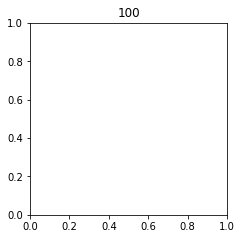

In [102]:
plot_predicted_trajectory(agent_semantic_dataset, loss18, list(range(5311, 5311+9)))

KeyError: 1578938506202813926

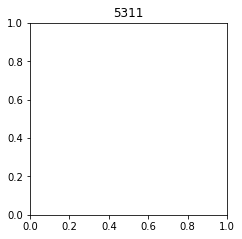

In [101]:
plot_predicted_trajectory(agent_semantic_dataset, loss50, list(range(5311, 5311+9)))